In [1]:
import os,sys,inspect
currentdir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parentdir = os.path.dirname(currentdir)
sys.path.insert(0,parentdir) 

from torch.utils.data import DataLoader
import tools.dataloader as dl
import tools.metrics as met
import tools.FSD as fsd
import matplotlib.pyplot as plt
import model.architecture as arc
import torch
import torchvision.models as models
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import torchvision.transforms.functional as TF
import numpy as np
import pandas as pd
import sklearn
from PIL import Image
from torchvision.models.segmentation.deeplabv3 import DeepLabHead
from torchvision.models.segmentation.fcn import FCNHead

ConvCRF_dir = '../ConvCRF'
sys.path.insert(0,ConvCRF_dir)
currentdir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parentdir = os.path.dirname(currentdir)
sys.path.insert(0,parentdir)

from convcrf import convcrf

import cv2
import glob

## Analysis on images

In [2]:
def get_mask(path):
    img = plt.imread(path)
    img = img[:,:,0]
    img = np.ceil(img) * 255
    img = np.uint8(img)

    return img

In [3]:
def get_centres(img, get_areas=False):
    img = np.uint8(img)
    ret, thresh = cv2.threshold(img, 0.001, 255, 0)
    im2, contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
    centres = []
    if get_areas:
        areas = []
    for c in contours:
        M = cv2.moments(c)
        if M["m00"] != 0:
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
            centres.append([cX, cY])
            if get_areas:
                area = cv2.contourArea(c)
                areas.append(area)

    centres = np.array(centres)
    if get_areas:
        return centres, np.array(areas)
    else:
        return centres

In [4]:
annotation_masks = glob.glob('../data/annotation_masks/*.png')
annotation_masks.sort()

### Number of annotaed floes per each image

In [5]:
for i in annotation_masks:
    mask = get_mask(i)
    centres, areas = get_centres(mask, get_areas=True)
    print(i.split('/')[-1])
    print(len(centres))

im_rsat2_ar_20081113112900_00042229_l.png
204
im_rsat2_ar_20110612221253_00079016_l.png
208
im_rsat2_ar_20110615105638_00079057_l.png
59
im_rsat2_ar_20120508112949_00091906_l.png
212
im_rsat2_ar_20120605224259_00092695_l.png
177
im_rsat2_ar_20120606104418_00092688_l.png
128
im_rsat2_ar_20130603112554_00104877_l.png
348
im_rsat2_ar_20130614223435_00105110_l.png
203
im_rsat2_ar_20140615112940_00115653_l.png
288


### Floe Size Distibutions for each image

In [6]:
annotation_masks

['../data/annotation_masks/im_rsat2_ar_20081113112900_00042229_l.png',
 '../data/annotation_masks/im_rsat2_ar_20110612221253_00079016_l.png',
 '../data/annotation_masks/im_rsat2_ar_20110615105638_00079057_l.png',
 '../data/annotation_masks/im_rsat2_ar_20120508112949_00091906_l.png',
 '../data/annotation_masks/im_rsat2_ar_20120605224259_00092695_l.png',
 '../data/annotation_masks/im_rsat2_ar_20120606104418_00092688_l.png',
 '../data/annotation_masks/im_rsat2_ar_20130603112554_00104877_l.png',
 '../data/annotation_masks/im_rsat2_ar_20130614223435_00105110_l.png',
 '../data/annotation_masks/im_rsat2_ar_20140615112940_00115653_l.png']

2020-07-04 20:49:52,269 WARNING No handles with labels found to put in legend.


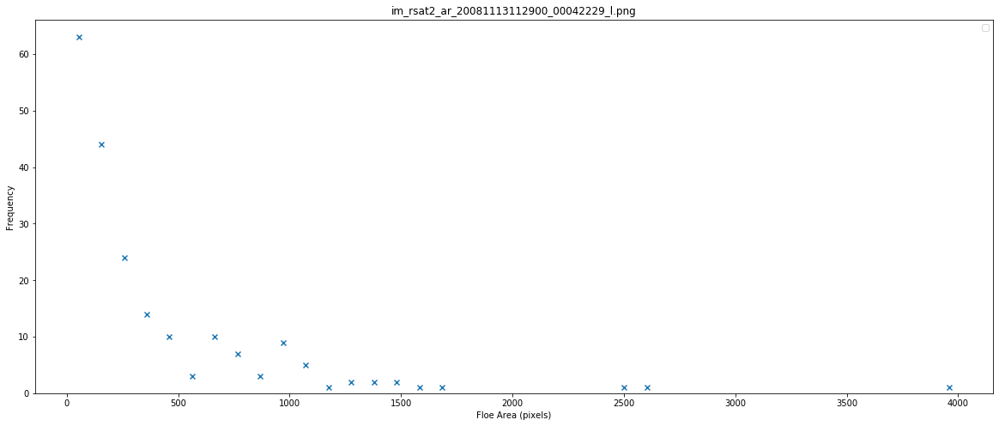

2020-07-04 20:49:52,787 WARNING No handles with labels found to put in legend.


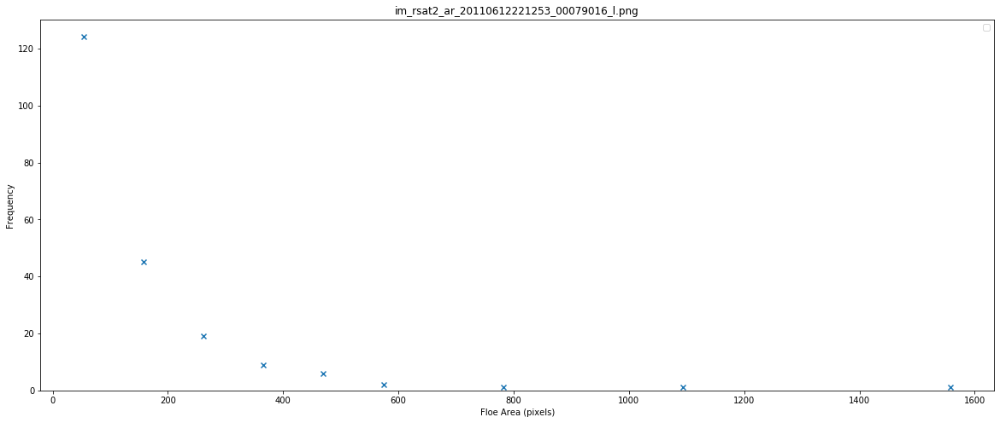

2020-07-04 20:49:53,043 WARNING No handles with labels found to put in legend.


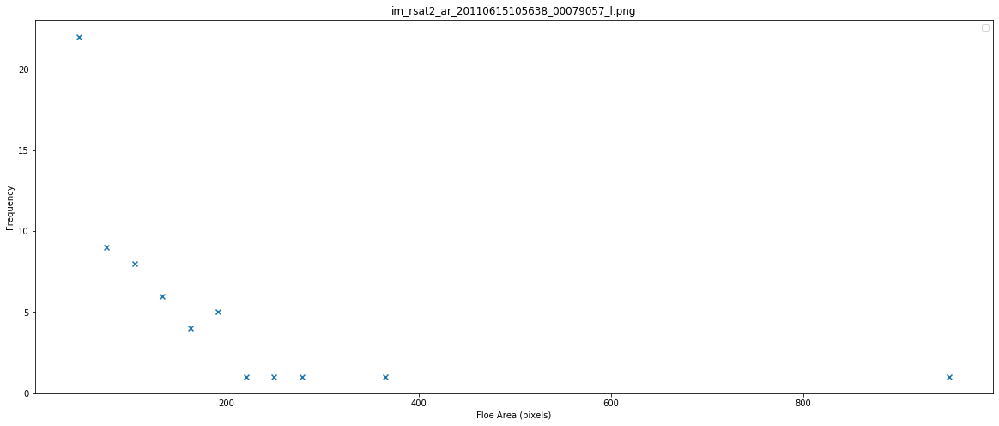

2020-07-04 20:49:53,378 WARNING No handles with labels found to put in legend.


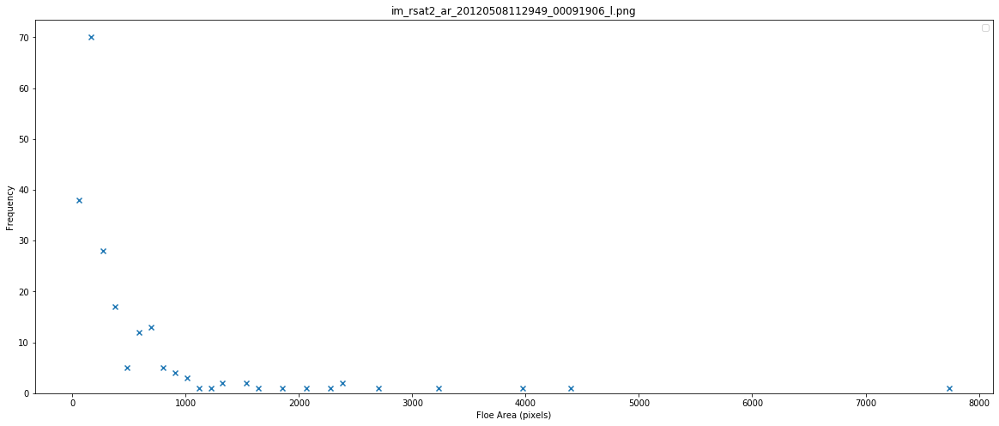

2020-07-04 20:49:53,867 WARNING No handles with labels found to put in legend.


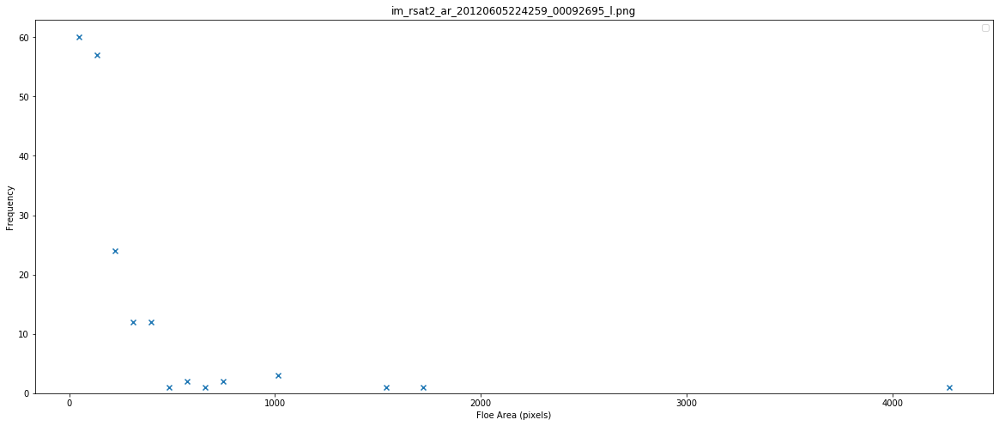

2020-07-04 20:49:54,204 WARNING No handles with labels found to put in legend.


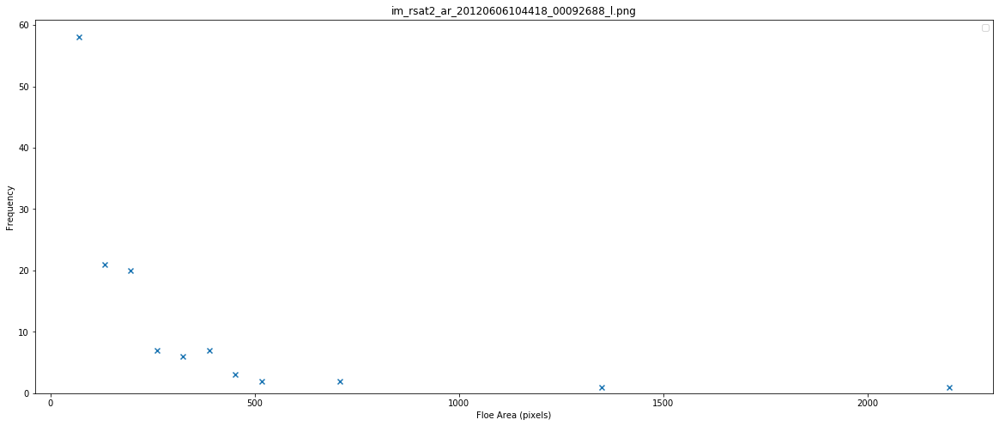

2020-07-04 20:49:54,458 WARNING No handles with labels found to put in legend.


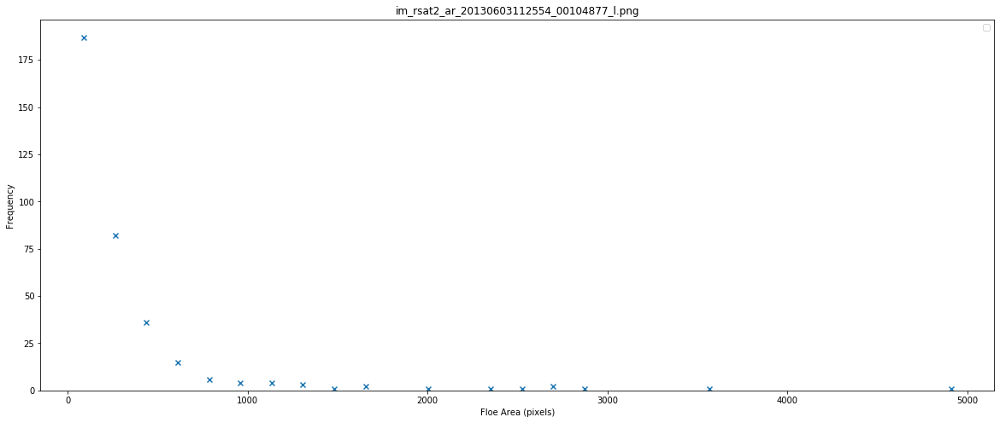

2020-07-04 20:49:54,864 WARNING No handles with labels found to put in legend.


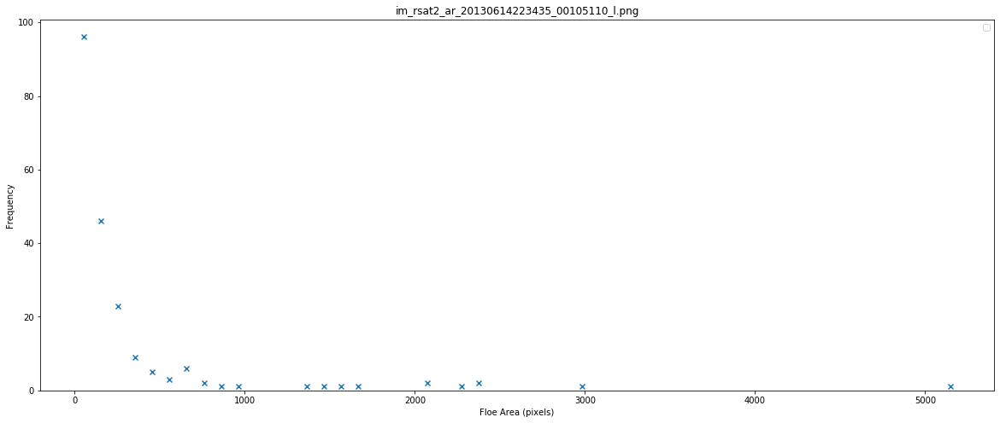

2020-07-04 20:49:55,153 WARNING No handles with labels found to put in legend.


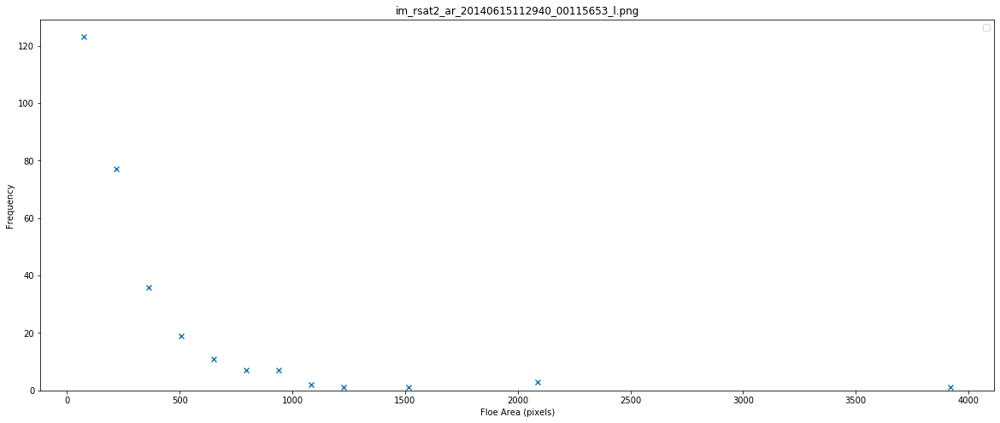

In [7]:
list_masks = []
for i in annotation_masks:
    mask = get_mask(i)
    _, areas_mask = get_centres(mask, get_areas=True)
    
    list_masks.append(areas_mask)
    
    bin_size = int(len(areas_mask)/ 2)  # seems to work the best bin size
    bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask, bin_size)
    fig, ax = plt.subplots(figsize=(20,8))
    fsd.plot_FSD(bins_x_mask, bins_y_mask, ax)
    plt.legend()
    plt.title(i.split('/')[-1])
    plt.show()

### Floe size distribution for all images

2020-07-04 20:50:58,715 WARNING No handles with labels found to put in legend.


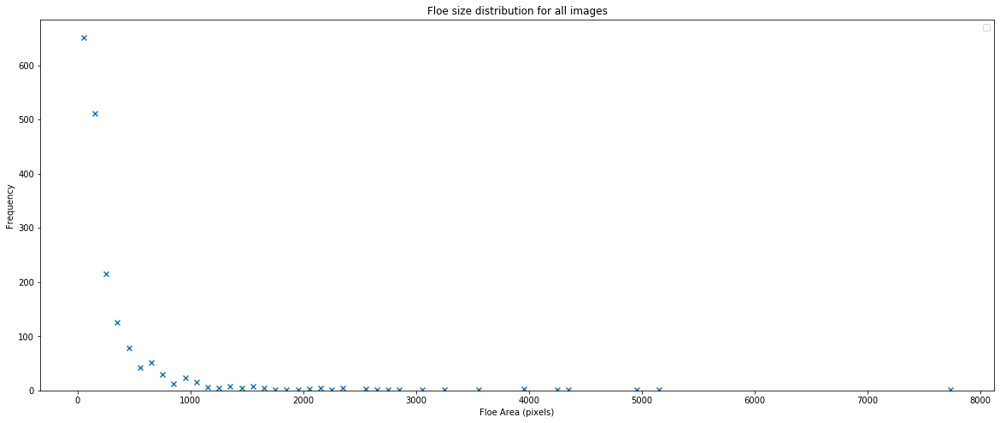

In [10]:
areas_mask_final = []

for i in annotation_masks:
    mask = get_mask(i)
    _, areas_mask = get_centres(mask, get_areas=True)
    areas_mask_final += list(areas_mask)
    
bin_size = 100
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax)
plt.legend()
plt.title('Floe size distribution for all images')
plt.show()

## Trying plotly

In [11]:
train_nos = [0, 1, 4, 6, 7]
val_nos   = [3, 5]
test_nos  = [2, 8]

In [12]:
train_areas = []
for i in train_nos:
    train_areas.extend(list_masks[i])
train_areas.sort()
len(train_areas)

1140

In [13]:
val_areas = []
for i in val_nos:
    val_areas.extend(list_masks[i])
val_areas.sort()
len(val_areas)

340

In [14]:
test_areas = []
for i in test_nos:
    test_areas.extend(list_masks[i])
test_areas.sort()
len(test_areas)

347

In [15]:
total_areas = []
total_areas.extend(train_areas)
total_areas.extend(val_areas)
total_areas.extend(test_areas)

In [16]:
Type_new = pd.Series([])
for i in range(len(total_areas)):
    if(i<1140):
        Type_new[i] = 'train'
    elif(i>= 1140 and i<1140+340):
        Type_new[i] = 'validation'
    elif(i>= 1140+340 and i<1140+340+347):
        Type_new[i] = 'test'

In [17]:
df1 = pd.DataFrame()

In [18]:
df1.insert(0,'area',value=total_areas)
df1

,area
0,2.0
1,2.0
2,2.0
3,2.0
4,2.0
...,...
1822,1503.0
1823,2018.0
1824,2123.5
1825,2157.5


In [50]:
df_49 = df1[df1.area >= 49]

In [52]:
df_49.describe()

,area
count,1625.000000
mean,319.450769
std,505.453208
min,49.000000
25%,97.000000
50%,166.000000
75%,323.500000
max,7739.000000


In [56]:
df_60 = df1[df1.area >= 60]
df_60.describe()

,area
count,1542.000000
mean,333.692931
std,515.042899
min,60.000000
25%,103.500000
50%,179.000000
75%,346.375000
max,7739.000000


In [ ]:
df1.

In [32]:
df1.describe()

,area
count,1827.000000
mean,287.023536
std,485.514959
min,2.000000
25%,78.000000
50%,144.000000
75%,294.250000
max,7739.000000


In [156]:
df1.insert(1, 'data_type', Type_new)

In [157]:
df1

,area,data_type
0,2.0,train
1,2.0,train
2,2.0,train
3,2.0,train
4,2.0,train
...,...,...
1822,1503.0,test
1823,2018.0,test
1824,2123.5,test
1825,2157.5,test


In [160]:
fig = px.line(df1, x="area", color='data_type')
fig.show()

In [46]:
import plotly.graph_objects as go
import numpy as np
import plotly.express as px

x = np.arange(10)

fig = go.Figure(data=go.Scatter(x=x, y=x**2))
fig.show()

In [47]:
import pandas as pd
df = pd.DataFrame(areas_mask_final, columns=['area'])

In [49]:
px.line(df, x="area", title = 'FSD of all images')

## Stand Alone ResUNet

In [2]:
from tools.crf_conf import default_conf as conf
conf['filter_size'] = 1
conf['blur'] = 0
conf['trainable'] = False
conf['trainable_bias'] = False

In [3]:
model2 = convcrf.GaussCRF(conf=conf, shape=(384,384), nclasses=2)
model2 = torch.load('/home/muzik999/MASc/iceFloe/floes/model/weights/UNET_CRF/NEW/4_model2_300iter_FT.mdl')

In [4]:
def RES_UNET(file_path, loss="BCE", plot=False, verbose=True, data='test'):
    if loss == "MSE":
        thresh = 0.5
    else:
        thresh = 0
    #file = torch.load(file_path)
    #resnet = models.resnet34(pretrained=True)
    #layers = list(resnet.children())
    #model = arc.ResUNet(layers, 1)
    model = torch.load(file_path1)
    model.eval()
    model.cuda()

    path_images = '/home/muzik999/MASc/iceFloe/floes/data/.OLD/valid_premade_patches_multi/image_patches/'
    path_masks = '/home/muzik999/MASc/iceFloe/floes/data/.OLD/valid_premade_patches_multi/mask_patches/'

    img_names = os.listdir(path_images)
    msk_names = os.listdir(path_masks)
    mIoUs, mAccs, pres, recs = [], [], [], []
    areas_mask_final, areas_pred_final = [], []

    for batch_idx in range(len(img_names)):
        X = mpimg.imread(path_images + img_names[batch_idx])
        
        if data =='test':
            X = np.stack((X,)*3, axis=-1)
        X = X[:, :, :3]
        
        if X.shape == (384, 384, 3):
            X = TF.to_tensor(X).unsqueeze(0).cuda() * 255
            y = Image.open(path_masks + msk_names[batch_idx])
            y = np.array(y).astype(bool)
            
            pred1 = model_stand_alone(X)   # USE pred['out'] for dlv3 and fcn
            pred1_sig = torch.sigmoid(pred1[0, 1, :, :]).cpu().detach().numpy()
            pred_final1 = (pred1_sig > 0.5)
            
            pred2 = model2.forward(pred1, X)
            pred2_sig = torch.sigmoid(pred2[0, 1, :, :]).cpu().detach().numpy()
            pred_final2 = (pred2_sig > 0.8)
            
            if False:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
                fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
                ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
                ax2.imshow(y)
                preds = ax4.imshow(torch.sigmoid(model_stand_alone(X)[0, 1, :, :]).cpu().detach().numpy())
                plt.colorbar(preds,fraction=0.046, pad=0.04)
                ax3.imshow(pred1[0, 1, :, :].cpu().detach().numpy())
                ax1.set_title(img_names[batch_idx])

#             pre, rec = met.precision_recall(y, pred_final1)
            mIoUs.append(met.mIoU(y, pred_final1))
            mAccs.append(met.mAcc(y, pred_final1))
#             pres.append(pre)
#             recs.append(rec)

#             _, areas_mask = met.get_centres(y, get_areas=True)
#             _, areas_pred = met.get_centres(pred_final1, get_areas=True)

#             areas_mask_final += list(areas_mask)
#             areas_pred_final += list(areas_pred)
            #plt.colorbar(preds,fraction=0.046, pad=0.04)
            #preds.set_clim(-6,6)
            #if batch_idx == 10:
            #    break

    if verbose:
        print('Model: 384_resUNET_200iter_0.5BCE.mdl')    
        print("IoU: {}".format(np.mean(mIoUs)))
        print("Accuracy: {}".format(np.mean(mAccs)))
        print("Precision: {}".format(np.mean(pres)))
        print("Recall: {}".format(np.mean(recs)))
        print("\n")
#     if plot:
#         bin_size = 50
#         bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
#         bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
#         fig, ax = plt.subplots(figsize=(20,8))
#         fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
#         fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
#         plt.legend()
#         plt.show()
    
    return [np.mean(mIoUs), np.mean(mAccs)]

In [5]:
file_path1 = '/home/muzik999/MASc/iceFloe/floes/model/weights/UNET_CRF/NEW/4_model1RESUNET_1500iter_FT.mdl'

In [6]:
resnet = models.resnet34(pretrained=True)
layers = list(resnet.children())
model = arc.ResUNet(layers, 1)

In [7]:
model_stand_alone = torch.load('/home/muzik999/MASc/iceFloe/floes/model/weights/UNET_CRF/NEW/4_model1RESUNET_1500iter_FT.mdl')

### Images

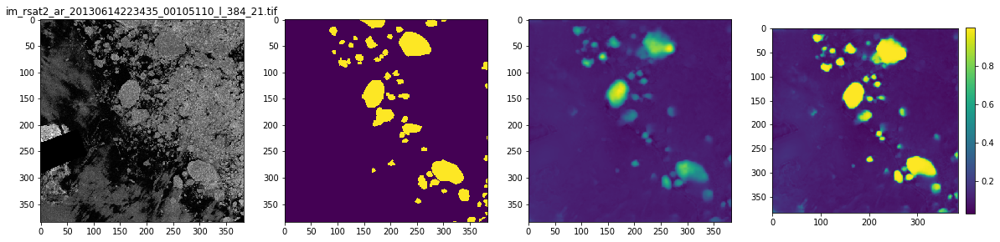

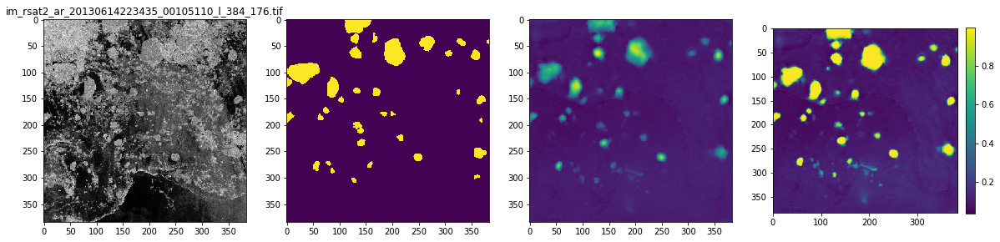

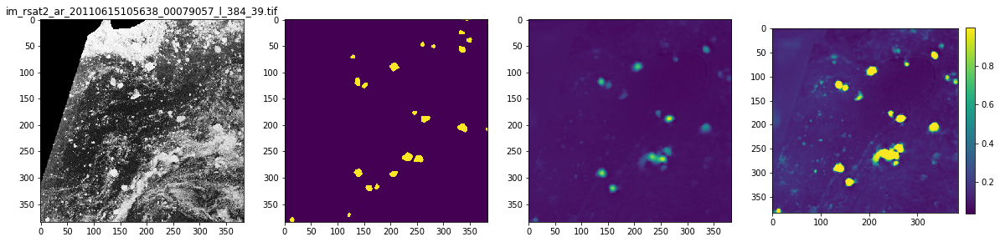

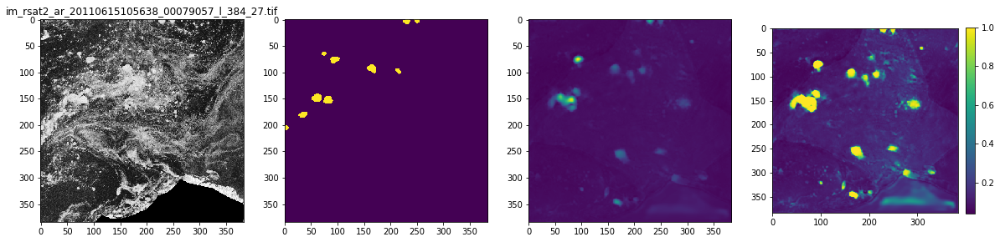

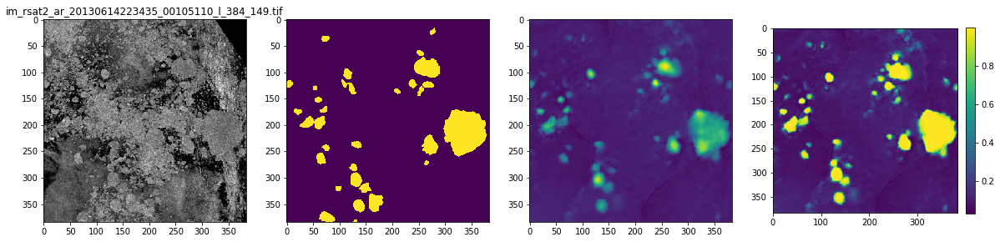

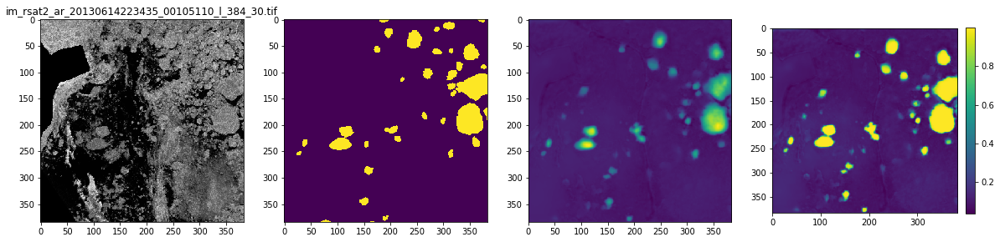

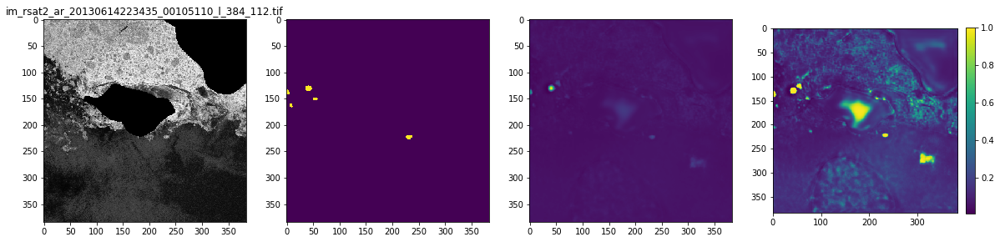

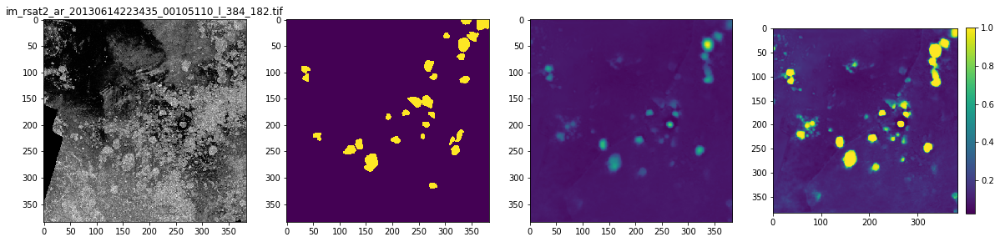

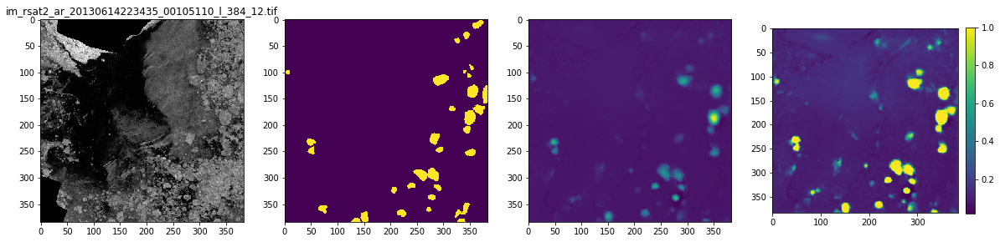

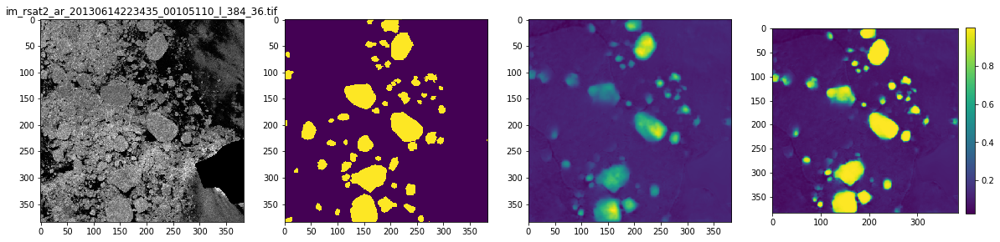

In [9]:
path_images = '/home/muzik999/MASc/iceFloe/floes/data/.OLD/valid_premade_patches_multi/image_patches/'
path_masks = '/home/muzik999/MASc/iceFloe/floes/data/.OLD/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []
count = 0

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    X = X[:, :, :3]
    if X.shape == (384, 384, 3):
        X = TF.to_tensor(X).unsqueeze(0).cuda() * 255
        y = Image.open(path_masks + msk_names[batch_idx])
        y = np.array(y).astype(bool)
        pred1 = model_stand_alone(X)   # USE pred['out'] for dlv3 and fcn
        pred1_sig = torch.sigmoid(pred1[0, 1, :, :]).cpu().detach().numpy()
        if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
            fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
            ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
            ax2.imshow(y)
            preds = ax4.imshow(torch.sigmoid(model_stand_alone(X)[0, 1, :, :]).cpu().detach().numpy())
            plt.colorbar(preds,fraction=0.046, pad=0.04)
            ax3.imshow(pred1[0, 1, :, :].cpu().detach().numpy())
            ax1.set_title(img_names[batch_idx])
        count += 1 
    if count==10:  
        break

### Results

In [10]:
# VALIDATION DATA
results = RES_UNET(file_path1, loss="BCE", plot=True, verbose=True, data='valid')

Model: 384_resUNET_200iter_0.5BCE.mdl
IoU: 0.669381745640748
Accuracy: 0.9678076171875
Precision: nan
Recall: nan




/home/muzik999/.conda/envs/pytorch_gpu/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/muzik999/.conda/envs/pytorch_gpu/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [11]:
# VALIDATION DATA
results = RES_UNET(file_path1, loss="BCE", plot=True, verbose=True, data='valid')

Model: 384_resUNET_200iter_0.5BCE.mdl
IoU: 0.669381745640748
Accuracy: 0.9678076171875
Precision: nan
Recall: nan




Model: 384_resUNET_200iter_0.5BCE.mdl
IoU: 0.6368720132799451
Accuracy: 0.965693122016059
Precision: 0.29121323484910955
Recall: 0.8332953173779084




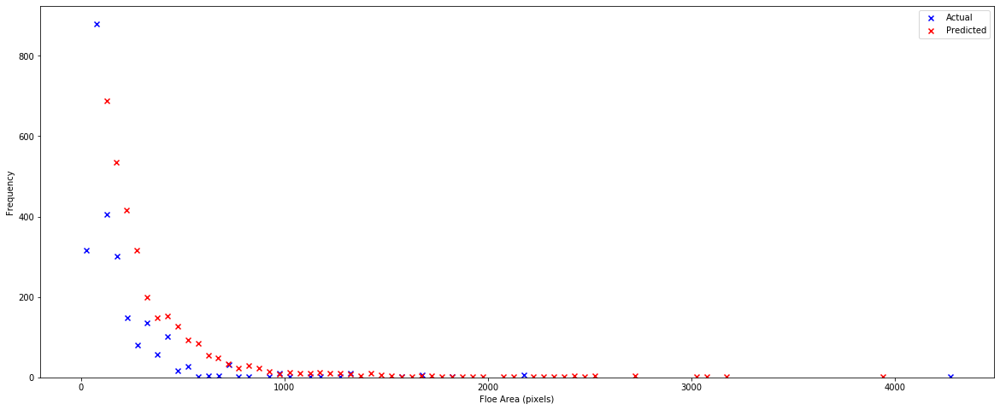

In [21]:
# TEST DATA
results = RES_UNET(file_path1, loss="BCE", plot=True, verbose=True, data='test')

## Model1 and Model2

In [12]:
def CONV_CRF(data='valid', plot=False):
    if data == 'valid':
        path_images = '../data/valid_premade_patches_multi/image_patches/'
        path_masks = '../data/valid_premade_patches_multi/mask_patches/'
    else:
        path_images = '../data/test_premade_patches_multi/image_patches/'
        path_masks = '../data/test_premade_patches_multi/mask_patches/'
    #path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
    #path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
    img_names = os.listdir(path_images)
    msk_names = os.listdir(path_masks)
    mIoUs1, mAccs1, pres1, recs1 = [], [], [], []
    mIoUs2, mAccs2, pres2, recs2 = [], [], [], []
    areas_mask_final, areas_pred_final1, areas_pred_final2 = [], [], []
    count = 0

    for batch_idx in range(len(img_names)):
        X = mpimg.imread(path_images + img_names[batch_idx])
        if data == 'test':
            X = np.stack((X,)*3, axis=-1)
        X = X[:, :, :3]
        if X.shape == (384, 384, 3):
            X = TF.to_tensor(X).unsqueeze(0).cuda() * 255
            y = Image.open(path_masks + msk_names[batch_idx])
            y = np.array(y).astype(bool)
            pred1 = model1(X)   # USE pred['out'] for dlv3 and fcn
            pred1_sig = torch.sigmoid(pred1[0, 1, :, :]).cpu().detach().numpy()
            pred_final1 = (pred1_sig > 0.5)
            pre1, rec1 = met.precision_recall(y, pred_final1)
            mIoUs1.append(met.mIoU(y, pred_final1))
            mAccs1.append(met.mAcc(y, pred_final1))
            pres1.append(pre1)
            recs1.append(rec1)
            
            pred2 = model2.forward(unary=pred1, img=X)
            pred2_sig = torch.sigmoid(pred2[0, 1, :, :]).cpu().detach().numpy()
            pred_final2 = (pred2_sig > 0.5)
            pre2, rec2 = met.precision_recall(y, pred_final2)
            mIoUs2.append(met.mIoU(y, pred_final2))
            mAccs2.append(met.mAcc(y, pred_final2))
            pres2.append(pre2)
            recs2.append(rec2)
            
            _, areas_mask = met.get_centres(y, get_areas=True)
            _, areas_pred1 = met.get_centres(pred_final1, get_areas=True)
            _, areas_pred2 = met.get_centres(pred_final2, get_areas=True)

            areas_mask_final += list(areas_mask)
            areas_pred_final1 += list(areas_pred1)
            areas_pred_final2 += list(areas_pred2)
            
    if plot:
        bin_size = 50
        bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
        bins_x_pred1, bins_y_pred1 = fsd.make_bins(areas_pred_final1, bin_size)
        fig, ax = plt.subplots(figsize=(20,8))
        fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
        fsd.plot_FSD(bins_x_pred1, bins_y_pred1, ax, color='r', data_type='Predicted')
        ax.set_title("ResUNet")
        plt.legend()

        bins_x_pred2, bins_y_pred2 = fsd.make_bins(areas_pred_final2, bin_size)
        fig, ax = plt.subplots(figsize=(20,8))
        fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
        fsd.plot_FSD(bins_x_pred2, bins_y_pred2, ax, color='r', data_type='Predicted')
        ax.set_title("ConvCRF")
        plt.legend()
        
        plt.show()
            
    results1 = [np.mean(mIoUs1), np.mean(mAccs1), np.mean(pres1), np.mean(recs1)]
    results2 = [np.mean(mIoUs2), np.mean(mAccs2), np.mean(pres2), np.mean(recs2)]
    
    return results1, results2

In [12]:
file1 = "model1_ResUNET_300iter_FT.mdl"
file_path1 = '../model/weights/CRF_stuff/' + file1

In [13]:
resnet = models.resnet34(pretrained=True)
layers = list(resnet.children())
model = arc.ResUNet(layers, 1)

In [14]:
model1 = torch.load(file_path1)

In [18]:
file2 = "model2_ResUNET_300iter_FT.mdl"
file_path2 = '../model/weights/CRF_stuff/' + file2
config = torch.load('../model/weights/UNET_CRF/6/6_config.json')

In [19]:
model2 = convcrf.GaussCRF(conf=config, shape=(384,384), nclasses=2)

In [21]:
model1.cuda()
model1.eval()
for param in list(model2.parameters()):
    param.requires_grad = False
model2.cuda()

#pred1 = model1(X)    # USE pred['out'] for dlv3 and fcn
#pred2 = model2.forward(unary=pred1, img=X)

GaussCRF(
  (CRF): ConvCRF()
)

### Results

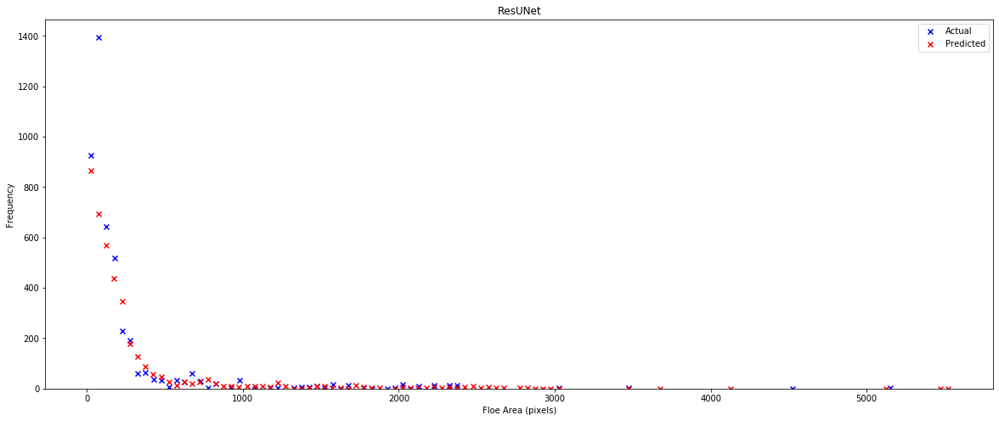

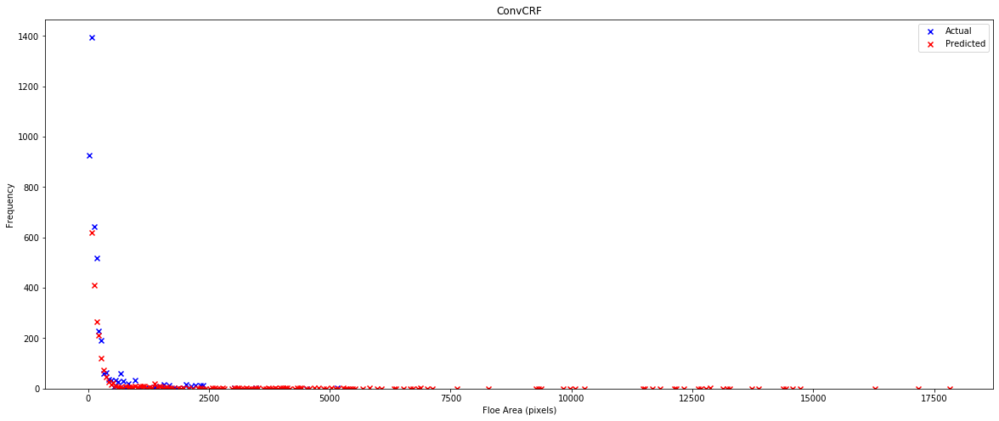

model 	 mIoU 	 	 mAcc 	 	 Precision 	 	 Recall
res_unet:  0.7472625551932692 0.9820540703667535 0.7052715583195386 0.6457485853607724
conv_crf:  0.6856432693504118 0.9671497260199652 0.5835919060414037 0.5448276010153701


In [35]:
#VALIDATION DATA
results1 , results2 = CONV_CRF(plot=True)
print("model \t mIoU \t \t mAcc \t \t Precision \t \t Recall")
print("res_unet: ", results1[0], results1[1], results1[2], results1[3])
print("conv_crf: ", results2[0], results2[1], results2[2], results2[3])

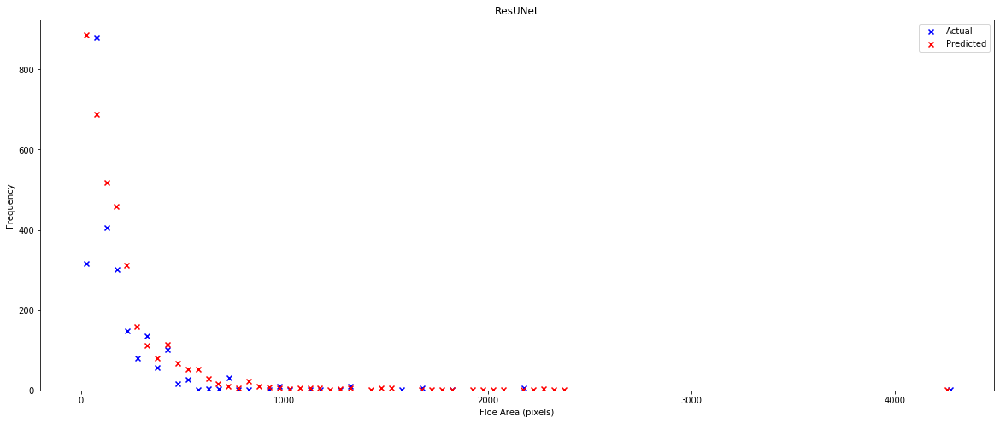

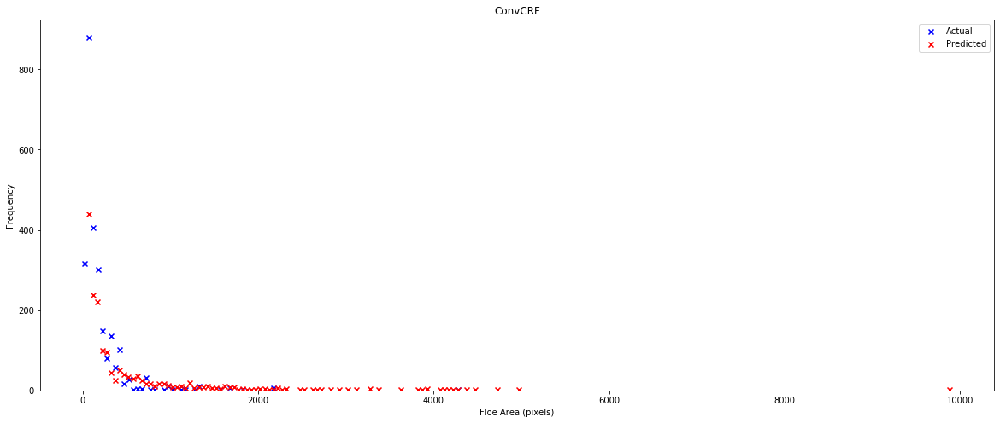

model 	 mIoU 	 	 mAcc 	 	 Precision 	 	 Recall
res_unet:  0.7304257782114278 0.9857697550455728 0.5323304344837412 0.8076751369867804
conv_crf:  0.6556852610057393 0.9789959038628473 0.3871151509385147 0.529520825033435


In [36]:
#TEST DATA
results1 , results2 = CONV_CRF(data='test', plot=True)
print("model \t mIoU \t \t mAcc \t \t Precision \t \t Recall")
print("res_unet: ", results1[0], results1[1], results1[2], results1[3])
print("conv_crf: ", results2[0], results2[1], results2[2], results2[3])

### Sample Images

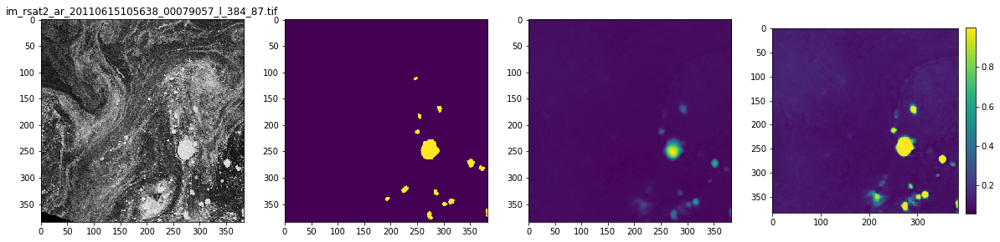

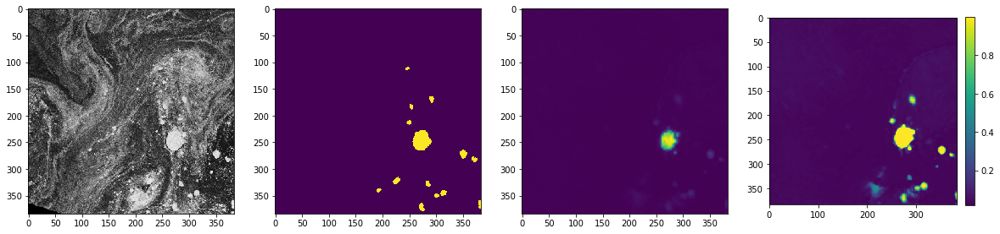

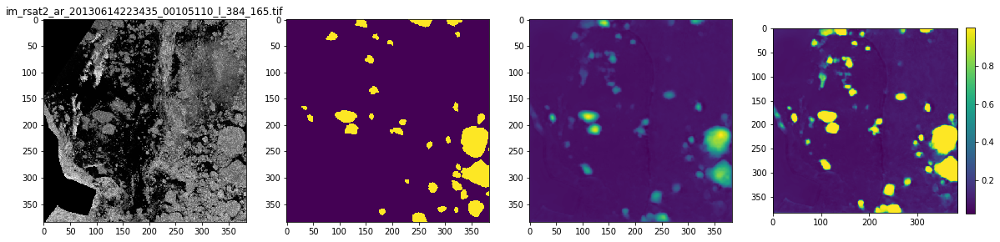

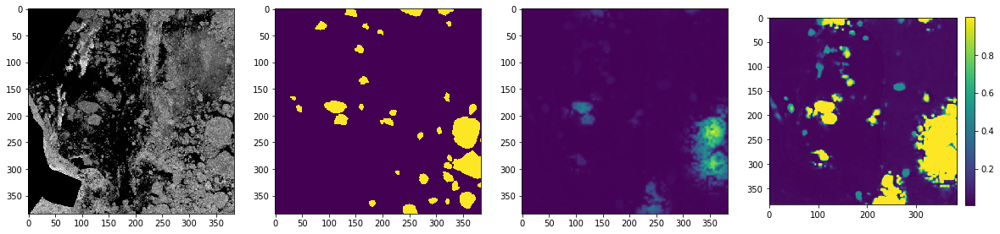

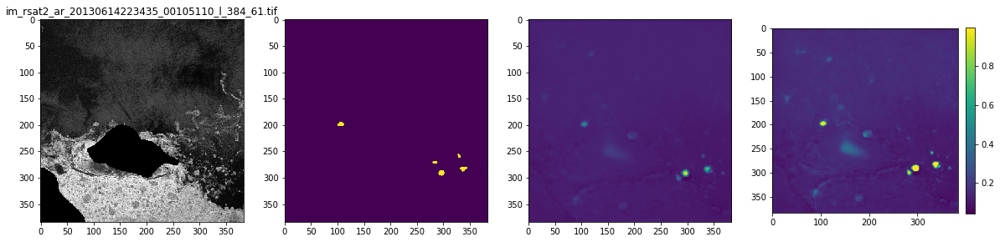

...

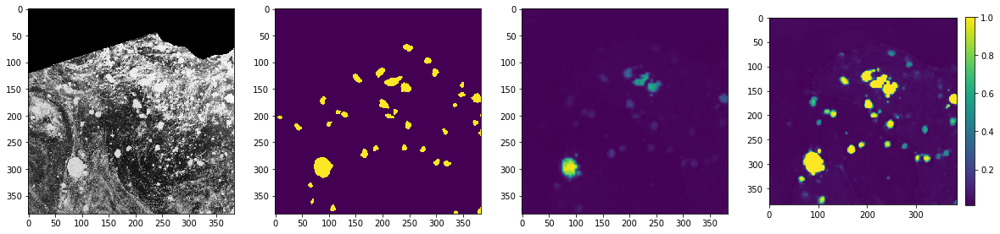

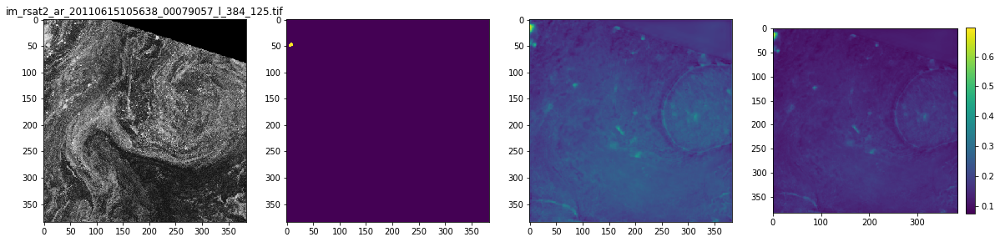

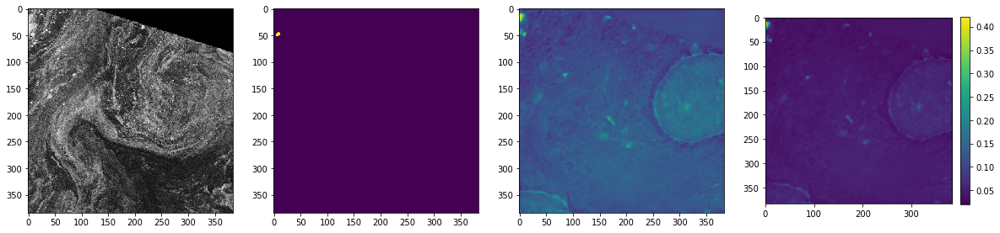

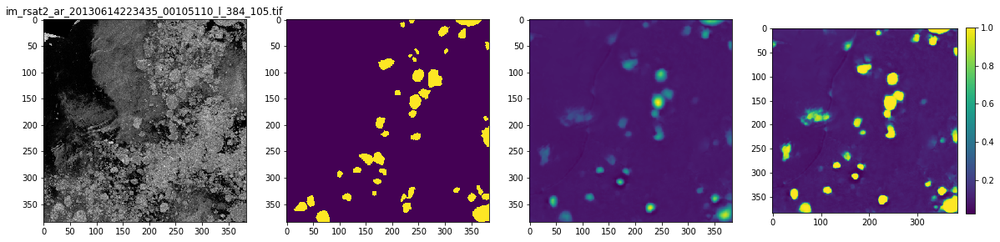

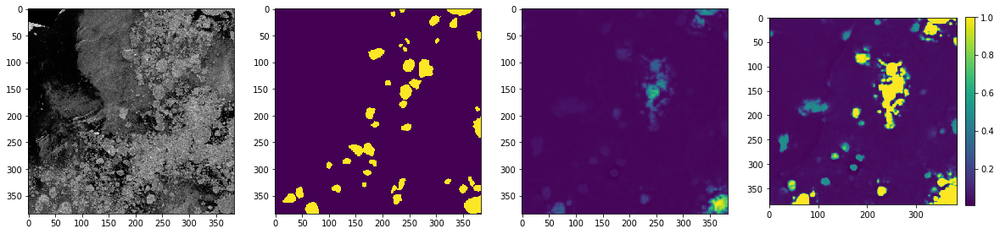

In [37]:
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []
count = 0

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    X = X[:, :, :3]
    if X.shape == (384, 384, 3):
        X = TF.to_tensor(X).unsqueeze(0).cuda() * 255
        y = Image.open(path_masks + msk_names[batch_idx])
        y = np.array(y).astype(bool)
        pred1 = model1(X)   # USE pred['out'] for dlv3 and fcn
        pred1_sig = torch.sigmoid(pred1[0, 1, :, :]).cpu().detach().numpy()
        if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
            fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
            ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
            ax2.imshow(y)
            preds = ax4.imshow(torch.sigmoid(model1(X)[0, 1, :, :]).cpu().detach().numpy())
            plt.colorbar(preds,fraction=0.046, pad=0.04)
            ax3.imshow(pred1[0, 1, :, :].cpu().detach().numpy())
            ax1.set_title(img_names[batch_idx])
        pred2 = model2.forward(unary=pred1, img=X)
        pred2_sig = torch.sigmoid(pred2[0, 1, :, :]).cpu().detach().numpy()
        if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
            fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
            ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
            ax2.imshow(y)
            preds = ax4.imshow(torch.sigmoid(model2.forward(unary=pred1, img=X)[0, 1, :, :]).cpu().detach().numpy())
            plt.colorbar(preds,fraction=0.046, pad=0.04)
            ax3.imshow(pred2[0, 1, :, :].cpu().detach().numpy())
        count += 1 
    if count==10:  
        break